In [2]:
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd 
import os

In [3]:
df=pd.read_excel("./QURAN.xlsx",index_col=0)
df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 77649 entries, 1 to 77649
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 1               0 non-null      float64
 1   SURAH                    77649 non-null  int64  
 2   VERSE                    77649 non-null  int64  
 3   LAST_TEXT                77649 non-null  object 
 4   LAST_TEXT_WITHOUT_SIGNS  77649 non-null  object 
 5   BRX_ROOT                 77649 non-null  object 
 6   MEANING_GROUP            77649 non-null  object 
 7   MEANING                  71982 non-null  object 
 8   LAST_ROOT                47266 non-null  object 
 9   ROOT                     49908 non-null  object 
 10  ABAY_TEXT                77649 non-null  object 
dtypes: float64(1), int64(2), object(8)
memory usage: 4.7+ MB


In [4]:
df.describe()

,Unnamed: 1,SURAH,VERSE
count,0.0,77649.000000,77649.000000
mean,NaN,24.613517,61.198277
std,NaN,21.975534,56.538689
min,NaN,1.000000,1.000000
25%,NaN,7.000000,20.000000
50%,NaN,18.000000,44.000000
75%,NaN,37.000000,85.000000
max,NaN,114.000000,286.000000


In [5]:
df.isna()

,Unnamed: 1,SURAH,VERSE,LAST_TEXT,LAST_TEXT_WITHOUT_SIGNS,BRX_ROOT,MEANING_GROUP,MEANING,LAST_ROOT,ROOT,ABAY_TEXT
ROW_NUM,,,,,,,,,,,
1,True,False,False,False,False,False,False,False,False,False,False
2,True,False,False,False,False,False,False,False,True,False,False
3,True,False,False,False,False,False,False,False,False,False,False
4,True,False,False,False,False,False,False,False,False,False,False
5,True,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
77645,True,False,False,False,False,False,False,False,False,False,False
77646,True,False,False,False,False,False,False,False,False,False,False
77647,True,False,False,False,False,False,False,False,True,True,False


In [6]:
revelation=[96,68,73,74,1,111,81,87,92,89,93,94,103,100,108,102,107,109,105,113,114,112,53,80,97,91,85,95,106,101,75,104,77,50,90,86,54,38,7,72,36,52,35,19,20,56,26,27,28,17,10,11,12,15,6,37,31,34,39,40,41,42,43,44,45,46,51,88,18,16,71,14,21,23,32,52,67,69,70,78,79,82,84,30,29,83,2,8,3,33,60,4,99,57,47,13,55,76,65,98,59,24,22,63,58,49,66,64,61,62,48,5,9,110]
#set nüzul order
df['Revelation'] = df['SURAH'].apply(lambda x: revelation[x-1])
df.head()


,Unnamed: 1,SURAH,VERSE,LAST_TEXT,LAST_TEXT_WITHOUT_SIGNS,BRX_ROOT,MEANING_GROUP,MEANING,LAST_ROOT,ROOT,ABAY_TEXT,Revelation
ROW_NUM,,,,,,,,,,,,
1,NaN,1,1,بِسْمِ,بسم,اسم,İsim,adıyla,س م و,س م و,بِسْمِ,96
2,NaN,1,1,اللهِ,الله,الله,Allah,Allah’ın,NaN,أ ل ه,اللّٰهِ,96
3,NaN,1,1,الرَّحْمَنِ,الرحمن,رحم,Acımak,Rahman,ر ح م,ر ح م,الرَّحْمٰنِ,96
4,NaN,1,1,الرَّحِيمِ,الرحيم,رحم,Acımak,Rahim,ر ح م,ر ح م,الرَّحٖيمِ,96
5,NaN,1,2,الْحَمْدُ,الحمد,حمد,Övmek,hamdolsun,ح م د,ح م د,اَلْحَمْدُ,96


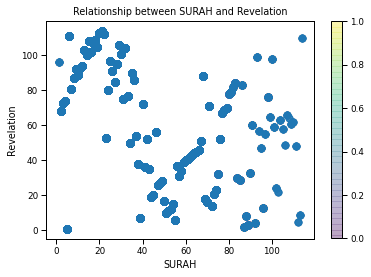

In [7]:
plt.rcParams.update({'font.size': 25})
sns.set_context("paper")

plt.scatter(df.SURAH, df.Revelation, s=50,
            alpha=0.2, cmap="viridis") #cmap renk paleti
plt.colorbar(); #hangi rengin hangi değere denk geldiğini gösteren yandaki ölçek
plt.xlabel("SURAH") #eksen ismi
plt.ylabel("Revelation") 
plt.title("Relationship between SURAH and Revelation") #plot ismi
plt.show()

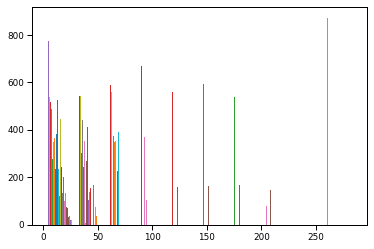

In [8]:
revs=df.Revelation.unique()
plt.hist([df.loc[df.Revelation == x, 'VERSE'] for x in revs], label=revs)
plt.show()

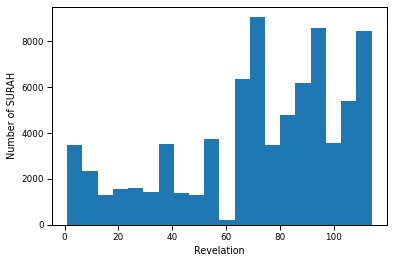

In [9]:
fig, ax = plt.subplots()
ax.hist(df.Revelation, label="Revelation", bins=20)
ax.set_xlabel("Revelation")
ax.set_ylabel("Number of SURAH")
plt.show()

In [21]:
dfChapter=pd.read_excel("./WikiChapters.xlsx", index_col=None)
dfChapter.head()

,ROW_NUM,TITLE,ARABIC_TITLE,ENG_DESC,VERSES_DESC,PLACE_OF_REV,EGYPT_CHRON,NOLDOKE_CHRON,MUQATTA,TITLE_REFER,MAIN_THEME
0,1,Al-Fatiha,ٱلْفَاتِحَة,"The Opening, The Opening of the Divine Writ, T...",7 (1),Makkah,5,48,NaN,Whole Surah [8],The fundamental principles of the Qur'an in a ...
1,2,Al-Baqarah,ٱلْبَقَرَة,"The Calf, The Cow",286 (40),Madinah,87,91,Alif Lam Mim,v. 67-73 [8],The necessity of God-consciousness.[8]
2,3,Al Imran,آلِ عِمْرَان,"The Family of Imraan, The House of ʿImrān",200 (20),Madinah,89,97,Alif Lam Mim,"v. 33, 35 [8]",The human nature of Isa.[8]
3,4,An-Nisa,ٱلنِّسَاء,The Women,176 (24),Madinah,92,100,NaN,Whole Surah [8],Unity of the human race and the mutual obligat...
4,5,Al-Ma'idah,ٱلْمَائِدَة,"The Food, The Repast, The Table",120 (16),Madinah,112,114,NaN,v. 112-114 [8],A series of ordinances (incl. Religious rites ...


In [115]:

import re
dfChapter['Revelation'] = pd.to_numeric(dfChapter['ROW_NUM'].apply(lambda x: revelation[x-1]))
dfChapter['VERSE_COUNT'] = pd.to_numeric(dfChapter['VERSES_DESC'].apply(lambda x: re.search(r'\d*\a*\d*', x)[0]))
dfChapter.head()

,ROW_NUM,TITLE,ARABIC_TITLE,ENG_DESC,VERSES_DESC,PLACE_OF_REV,EGYPT_CHRON,NOLDOKE_CHRON,MUQATTA,TITLE_REFER,MAIN_THEME,Revelation,VERSE_COUNT,WOMAN_VERSE_COUNT
0,1,Al-Fatiha,ٱلْفَاتِحَة,"The Opening, The Opening of the Divine Writ, T...",7 (1),Makkah,5,48,NaN,Whole Surah [8],The fundamental principles of the Qur'an in a ...,96,7,7
1,2,Al-Baqarah,ٱلْبَقَرَة,"The Calf, The Cow",286 (40),Madinah,87,91,Alif Lam Mim,v. 67-73 [8],The necessity of God-consciousness.[8],68,286,286
2,3,Al Imran,آلِ عِمْرَان,"The Family of Imraan, The House of ʿImrān",200 (20),Madinah,89,97,Alif Lam Mim,"v. 33, 35 [8]",The human nature of Isa.[8],73,200,200
3,4,An-Nisa,ٱلنِّسَاء,The Women,176 (24),Madinah,92,100,NaN,Whole Surah [8],Unity of the human race and the mutual obligat...,74,176,176
4,5,Al-Ma'idah,ٱلْمَائِدَة,"The Food, The Repast, The Table",120 (16),Madinah,112,114,NaN,v. 112-114 [8],A series of ordinances (incl. Religious rites ...,1,120,120


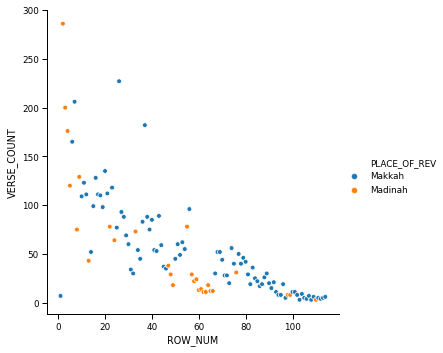

In [50]:
sns.relplot(x="ROW_NUM", y="VERSE_COUNT",data=dfChapter, hue="PLACE_OF_REV", kind="scatter")
plt.show()

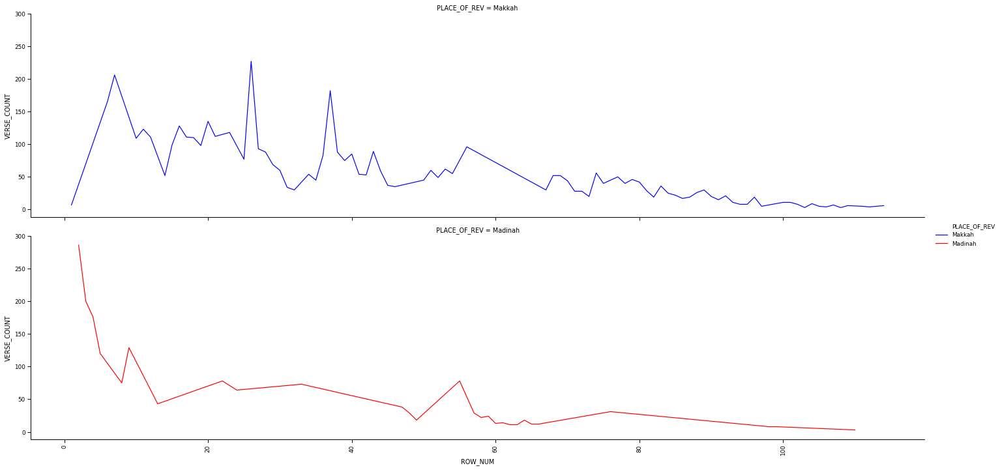

In [70]:
#dfChapter.sort_values(['ROW_NUM']).reset_index(drop=True)
g=sns.relplot(x="ROW_NUM", y="VERSE_COUNT", hue="PLACE_OF_REV",aspect=4, palette=["b","r"],data=dfChapter, kind="line",  ci="sd",row="PLACE_OF_REV")
plt.xlabel="SURAH_NO"
plt.xticks(rotation=90)
plt.show()


In [83]:
df.head()
df.isna().any()


Unnamed: 1                  True
SURAH                      False
VERSE                      False
LAST_TEXT                  False
LAST_TEXT_WITHOUT_SIGNS    False
BRX_ROOT                   False
MEANING_GROUP              False
MEANING                     True
LAST_ROOT                   True
ROOT                        True
ABAY_TEXT                  False
Revelation                 False
dtype: bool

In [104]:
dfKadin = df[df['MEANING_GROUP']=='Allah'].groupby(['SURAH']).count()
dfKadin.head()

,Unnamed: 1,VERSE,LAST_TEXT,LAST_TEXT_WITHOUT_SIGNS,BRX_ROOT,MEANING_GROUP,MEANING,LAST_ROOT,ROOT,ABAY_TEXT,Revelation
SURAH,,,,,,,,,,,
1,0,2,2,2,2,2,2,0,2,2,2
2,0,282,282,282,282,282,282,1,282,282,282
3,0,210,210,210,210,210,210,0,210,210,210
4,0,229,229,229,229,229,229,2,229,229,229
5,0,148,148,148,148,148,148,0,148,148,148


In [211]:
#root: أ ل ه
#unmeaning
dfMerge=df.merge(dfChapter,left_on="SURAH",right_on="ROW_NUM")
dfMerge.describe()
#sns.relplot(x="TITLE", y="MEANING_GROUP",data=dfMerge, hue="PLACE_OF_REV", kind="scatter", aspect=4, palette=["b","r"])
#plt.xticks(rotation=90)
#plt.show()

,Unnamed: 1,SURAH,VERSE,Revelation_x,ROW_NUM,EGYPT_CHRON,NOLDOKE_CHRON,Revelation_y,VERSE_COUNT,WOMAN_VERSE_COUNT
count,0.0,77649.000000,77649.000000,77649.000000,77649.000000,77649.000000,77649.000000,77649.000000,77649.000000,77649.000000
mean,NaN,24.613517,61.198277,72.392355,24.613517,70.650375,80.329418,72.392355,118.289418,118.289418
std,NaN,21.975534,56.538689,31.399510,21.975534,24.882277,21.979757,31.399510,73.169981,73.169981
min,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,3.000000
25%,NaN,7.000000,20.000000,53.000000,7.000000,51.000000,67.000000,53.000000,62.000000,62.000000
50%,NaN,18.000000,44.000000,77.000000,18.000000,70.000000,84.000000,77.000000,110.000000,110.000000
75%,NaN,37.000000,85.000000,95.000000,37.000000,89.000000,97.000000,95.000000,165.000000,165.000000
max,NaN,114.000000,286.000000,114.000000,114.000000,114.000000,114.000000,114.000000,286.000000,286.000000


In [194]:
dfMerge['Counts'] = np.zeros(len(df))
dfMeaning= dfMerge.groupby(['TITLE','MEANING_GROUP','ROW_NUM','PLACE_OF_REV'], as_index=False)['Counts'].count()
print(dfMeaning.head())


TITLE MEANING_GROUP  ROW_NUM PLACE_OF_REV  Counts
0  Abasa          -den       80       Makkah       4
1  Abasa     -den -dan       80       Makkah       1
2  Abasa        -e, -a       80       Makkah       1
3  Abasa           Ama       80       Makkah       2
4  Abasa   Anlaşmazlık       80       Makkah       2


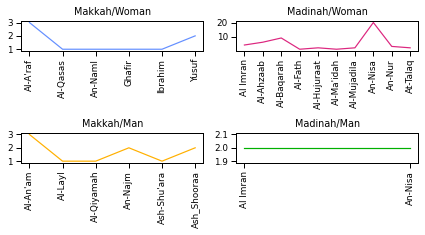

In [209]:
# Create a figure with 3x1 subplot and activate the top subplot
import matplotlib.pyplot as plt
plt.subplot(321)
dfSub=dfMeaning[(dfMeaning['MEANING_GROUP']=='Kadın' )& (dfMeaning.PLACE_OF_REV=='Makkah')]
plt.plot(dfSub.TITLE,dfSub.Counts, color="#648FFF")
plt.xticks(rotation=90)
plt.title('Makkah/Woman')

plt.subplot(322)
dfSub=dfMeaning[(dfMeaning['MEANING_GROUP']=='Kadın' )& (dfMeaning.PLACE_OF_REV=='Madinah')]
plt.plot(dfSub.TITLE,dfSub.Counts, color="#DC267F")
plt.xticks(rotation=90)
plt.title('Madinah/Woman')

plt.subplot(323)
dfSub=dfMeaning[(dfMeaning['MEANING_GROUP']=='Erkek' )& (dfMeaning.PLACE_OF_REV=='Makkah')]
plt.plot(dfSub.TITLE,dfSub.Counts, color="#FFB000")
plt.xticks(rotation=90)
plt.title('Makkah/Man')
# Activate the bottom subplot
plt.subplot(324)
dfSub=dfMeaning[(dfMeaning['MEANING_GROUP']=='Erkek' )& (dfMeaning.PLACE_OF_REV=='Madinah')]
plt.plot(dfSub.TITLE,dfSub.Counts, color="#00B000")
plt.xticks(rotation=90)
plt.title('Madinah/Man')

# Improve the spacing between subplots
plt.tight_layout()